In [1]:
using DifferentialEquations
using Plots
using Dierckx
using AbstractFFTs
using FFTW
using QuadGK
using LaTeXStrings
using Statistics
using Measures
using Roots
pyplot()

┌ Warning: `getindex(o::PyObject, s::AbstractString)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o."s"` instead of `o["s"]`.
│   caller = top-level scope at none:0
└ @ Core none:0


Plots.PyPlotBackend()

In [2]:
function diff_eq1(du, u, p, t) #flat spacetime
    a = p[1]
    w = p[2]
    t0 = p[3]
    s = p[4]
    n = p[5]
    du[1] = -n^2*u[2]
    du[2] = u[1]
end

function diff_eq2(du, u, p, t)  #grav wave
    a = p[1]
    w = p[2]
    t0 = p[3]
    s = p[4]
    k = p[5]
    l = p[6]
    n = p[7]
    m = p[8]
    lam = p[9]
    du[1] = -k^2*u[2] + a*lam^2*cos(w*lam*t)*u[2]*exp(-lam^2*(t-t0)^2/(2*s^2))
    du[2] = u[1]
    du[3] = -l^2*u[4] - a*lam^2*cos(w*lam*t)*u[4]*exp(-lam^2*(t-t0)^2/(2*s^2))
    du[4] = u[3]
    du[5] = -n^2*u[6] + a/2*lam*(2*u[2]^2 - 2*u[4]^2)*(-w*lam*sin(w*lam*t) -cos(w*lam*t)*lam^2*(t-t0)/s^2)*exp(-lam^2*(t-t0)^2/(2*s^2))
    - 2*a*lam*(2*u[2]*u[1] - 2*u[4]*u[3])*cos(w*lam*t)*exp(-lam^2*(t-t0)^2/(2*s^2))
    du[6] = u[5]
    du[7] = -m^2*u[8] + a/2*lam*(u[2]^2 - u[4]^2)*(-w*lam*sin(w*lam*t) -cos(w*lam*t)*lam^2*(t-t0)/s^2)*exp(-lam^2*(t-t0)^2/(2*s^2))
    - 2*a*lam*(u[2]*u[1] - u[4]*u[3])*cos(w*lam*t)*exp(-lam^2*(t-t0)^2/(2*s^2))
    du[8] = u[7]
end

function grav_wave(t, p)
    a = p[1]
    w = p[2]
    t0 = p[3]
    s = p[4]
    n = p[5]
    
    return a*cos.(w*t).*exp.(-(t .- t0).^2/(2*s^2))
end

grav_wave (generic function with 1 method)

┌ Warning: `binary_minheap(xs::AbstractVector{T}) where T` is deprecated, use `BinaryMinHeap(xs)` instead.
│   caller = tstop_saveat_disc_handling at solve.jl:371 [inlined]
└ @ Core C:\Users\Vojta\.julia\packages\OrdinaryDiffEq\NS3ps\src\solve.jl:371
┌ Warning: `binary_minheap(xs::AbstractVector{T}) where T` is deprecated, use `BinaryMinHeap(xs)` instead.
│   caller = #__init#203(::Int64, ::Array{Float64,1}, ::Array{Float64,1}, ::Array{Float64,1}, ::Nothing, ::Bool, ::Nothing, ::Bool, ::Bool, ::Nothing, ::Bool, ::Bool, ::Float64, ::Bool, ::Rational{Int64}, ::Nothing, ::Nothing, ::Int64, ::Rational{Int64}, ::Int64, ::Int64, ::Rational{Int64}, ::Bool, ::Int64, ::Nothing, ::Nothing, ::Int64, ::Float64, ::Float64, ::typeof(DiffEqBase.ODE_DEFAULT_NORM), ::typeof(LinearAlgebra.opnorm), ::typeof(DiffEqBase.ODE_DEFAULT_ISOUTOFDOMAIN), ::typeof(DiffEqBase.ODE_DEFAULT_UNSTABLE_CHECK), ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Int64, ::String, ::typeof(DiffEqBase.ODE_DEFAU

┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_set_lims(::PyCall.PyObject, ::Plots.Axis) at pyplot.jl:838
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:838
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_set_ticks(::PyCall.PyObject, ::Tuple{Array{Float64,1},Array{String,1}}, ::Symbol) at pyplot.jl:843
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:843
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_set_ticks(::PyCall.PyObject, ::Tuple{Array{Float64,1},Array{String,1}}, ::Symbol) at pyplot.jl:857
└ @ Plots C:\Use

┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_add_legend(::Plots.Plot{Plots.PyPlotBackend}, ::Plots.Subplot{Plots.PyPlotBackend}, ::PyCall.PyObject) at pyplot.jl:1270
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1270
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_add_legend(::Plots.Plot{Plots.PyPlotBackend}, ::Plots.Subplot{Plots.PyPlotBackend}, ::PyCall.PyObject) at pyplot.jl:1271
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1271
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_add_legend(::Plots.Plot{Plots

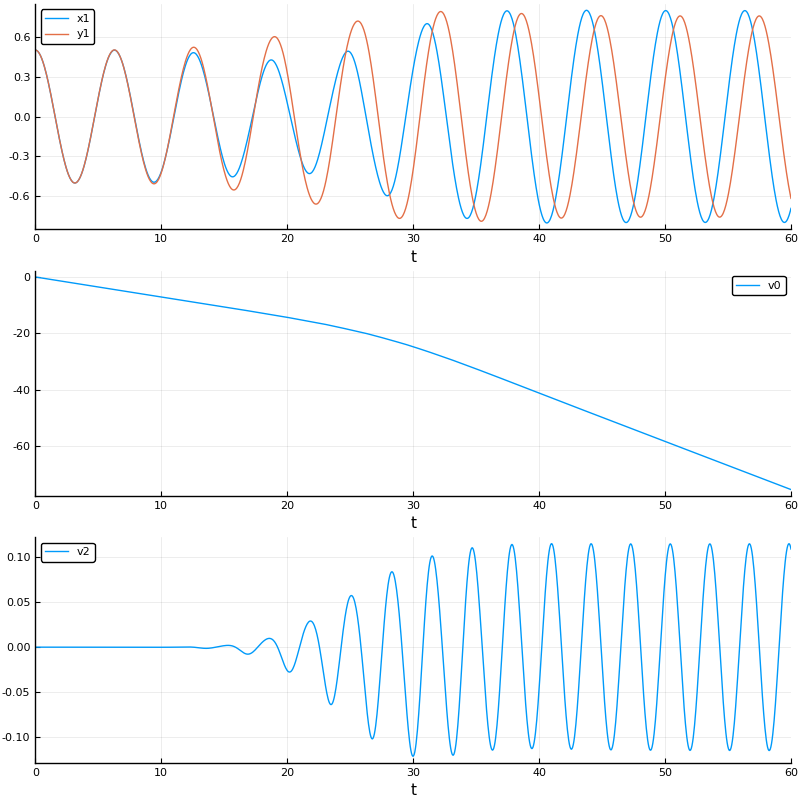

┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _update_plot_object(::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1294
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1294
┌ Warning: `getindex(f::Figure, x)` is deprecated, use `getproperty(f, x)` instead.
│   caller = _show(::Base64.Base64EncodePipe, ::MIME{Symbol("image/png")}, ::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1332
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1332
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _show(::Base64.Base64EncodePipe, ::MIME{Symbol("image/png")}, ::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1332
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\

In [3]:
lam = 1/sqrt(2)
u0 = [0.0;0.5;0.0;0.5;-lam;0.0;0.0;0.0]
tspan = (0.0,60.0)
w_r = 2*sqrt(2)-0.2
w_n = 2*sqrt(2)-0.8
p_r = [0.5,w_r, 25, 5, 1, 1, 0, 2,lam]
p_n = [0.5,w_n, 25, 5, 1, 1, 0, 2,lam]
#2*sqrt(2)-0.2

prob_r = ODEProblem(diff_eq2,u0,tspan,p_r)
sol_r = solve(prob_r);

prob_n = ODEProblem(diff_eq2,u0,tspan,p_n)
sol_n = solve(prob_n);

p1 = plot(sol_r, vars = (0,2), label = "x1")
plot!(sol_r, vars = (0,4), label = "y1")
p2 = plot(sol_r, vars = (0,6), label = "v0")
p3 = plot(sol_r, vars = (0,8), label = "v2")

plot(p1, p2, p3, layout = (3,1), size = (800, 800), linewidth = 1)

In [4]:
solx_r = sol_r[2, :]
soly_r = sol_r[4, :]
solv0_r = sol_r[6, :]
solv2_r = sol_r[8, :]

splx_r = Spline1D(sol_r.t, solx_r)
sply_r = Spline1D(sol_r.t, soly_r)
splv0_r = Spline1D(sol_r.t, solv0_r)
splv2_r = Spline1D(sol_r.t, solv2_r)

time_u_v_r(t,s) = sqrt(2)/2*(lam*t - splv0_r(t) - splv2_r(t)*cos(2*s))
z_u_v_r(t,s) = -sqrt(2)/2*(lam*t + splv0_r(t) + splv2_r(t)*cos(2*s))

z_u_v_r (generic function with 1 method)

In [5]:
solx_n = sol_n[2, :]
soly_n = sol_n[4, :]
solv0_n = sol_n[6, :]
solv2_n = sol_n[8, :]

splx_n = Spline1D(sol_n.t, solx_n)
sply_n = Spline1D(sol_n.t, soly_n)
splv0_n = Spline1D(sol_n.t, solv0_n)
splv2_n = Spline1D(sol_n.t, solv2_n)

time_u_v_n(t,s) = sqrt(2)/2*(lam*t - splv0_n(t) - splv2_n(t)*cos(2*s))
z_u_v_n(t,s) = -sqrt(2)/2*(lam*t + splv0_n(t) + splv2_n(t)*cos(2*s))

z_u_v_n (generic function with 1 method)

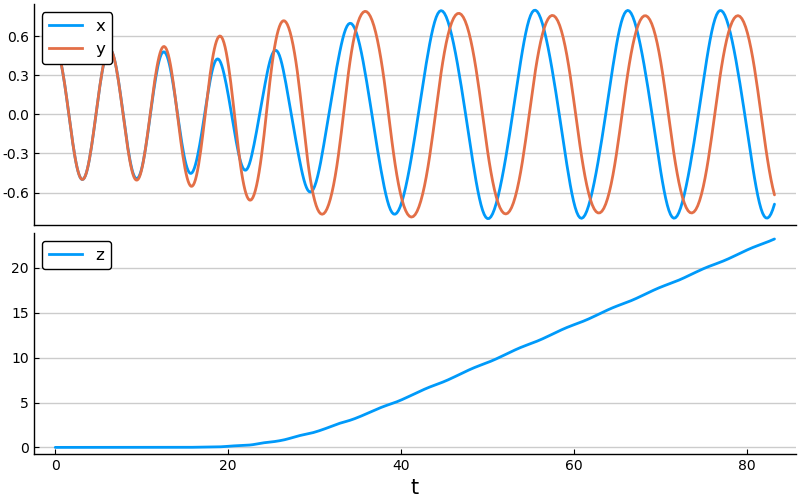

┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_set_ticks(::PyCall.PyObject, ::Tuple{Array{Any,1},Array{String,1}}, ::Symbol) at pyplot.jl:843
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:843
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_set_ticks(::PyCall.PyObject, ::Tuple{Array{Any,1},Array{String,1}}, ::Symbol) at pyplot.jl:857
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:857
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_set_ticks(::PyCall.PyObject, ::Tuple{Array{Any,1},Array{String,1}}, ::Symbol) at py

In [6]:
pyplot()

N_time = 500
time_c = tspan[1]:tspan[2]/N_time:tspan[2]
N = 500
sigma_c = 0:2*pi/N:2*pi

p1 = plot(abs.(time_u_v_r(time_c, 0)), splx_r(time_c), label = "x", legend = :topleft)
plot!(abs.(time_u_v_r(time_c, 0)), sply_r(time_c), label = "y", xticks = [])

p2 = plot(abs.(time_u_v_r(time_c, 0)), z_u_v_r(time_c,0), label = "z", xlabel = "t")

pp = plot(p1, p2, layout = (2,1), linewidth = 2, legendfontsize = 12, grid = :y,
    thickness_scaling = 1.0, gridlinewidth = 1.0, gridalpha = 0.2, size = (800, 500), guidefontsize = 15, tickfontsize = 10)

#Plots.savefig(pp, "grav_evol_res.pdf")

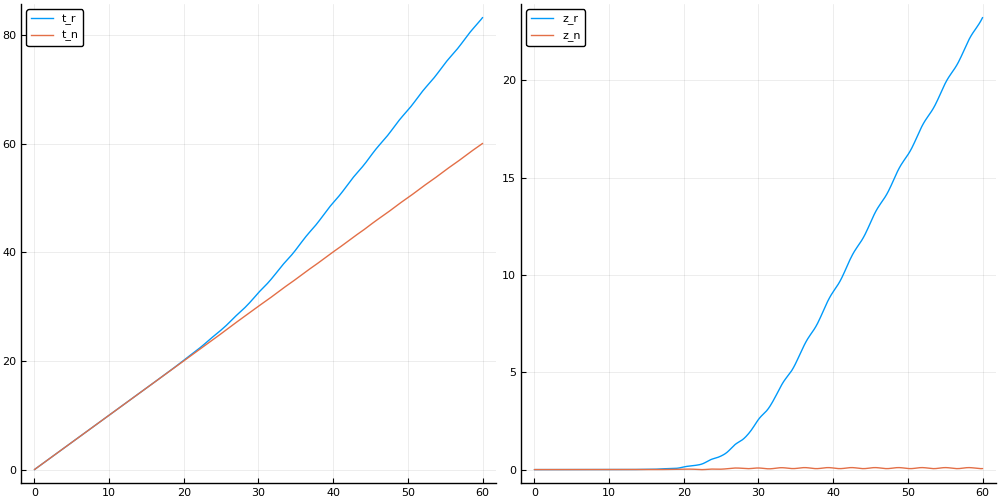

In [7]:
sigma = 0
p1 = Plots.plot(time_c, time_u_v_r.(time_c,sigma), label = "t_r")
Plots.plot!(time_c, time_u_v_n.(time_c,sigma), label = "t_n")
p2 = Plots.plot(time_c, z_u_v_r.(time_c,sigma), label = "z_r")
Plots.plot!(time_c, z_u_v_n.(time_c,sigma), label = "z_n")
Plots.plot(p1, p2, size = (1000, 500))

┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _before_layout_calcs(::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:970
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:970
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _before_layout_calcs(::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:970
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:970
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _before_layout_calcs(::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:971
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backen

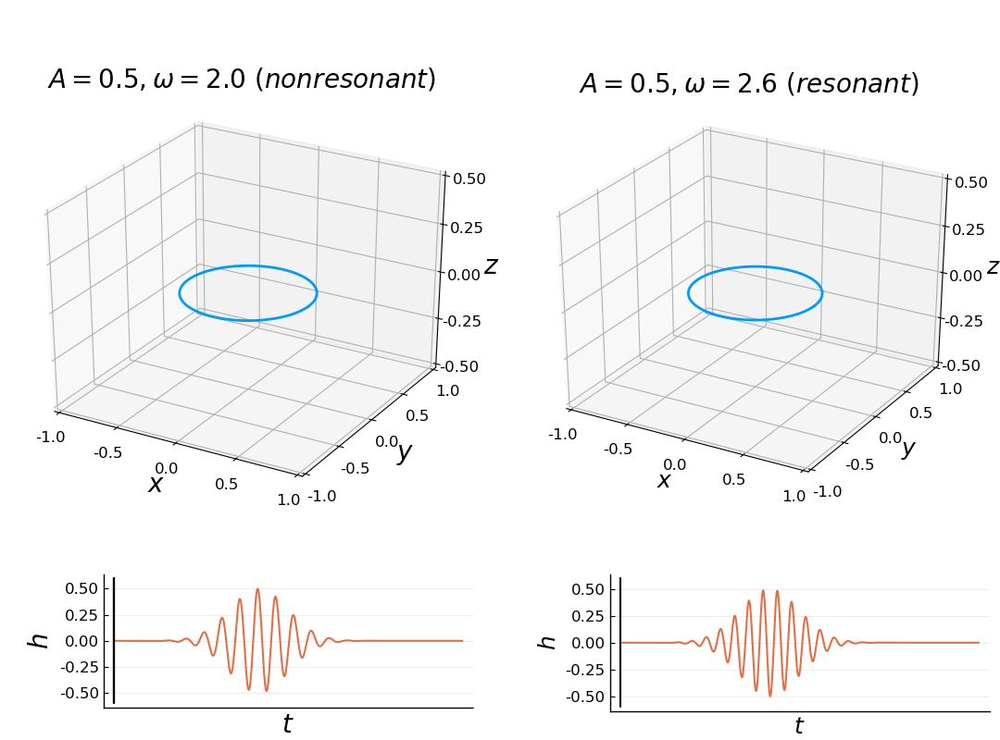

┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_set_ticks(::PyCall.PyObject, ::Nothing, ::Symbol) at pyplot.jl:843
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:843
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_set_ticks(::PyCall.PyObject, ::Nothing, ::Symbol) at pyplot.jl:849
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:849
C:\Users\Vojta\.julia\conda\3\lib\site-packages\matplotlib\cbook\__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


In [8]:
N_time = 1000
time_c = tspan[1]:tspan[2]/N_time:tspan[2]
N = 500
sigma_c = 0:2*pi/N:2*pi

time_opt_r(tau, t, s) = time_u_v_r(tau,s) - t
time_opt_n(tau, t, s) = time_u_v_n(tau,s) - t

param_tau_r = Array{Float64, 1}(undef, length(time_c))
param_tau_n = Array{Float64, 1}(undef, length(time_c))
time_coord = range(0.0, length = length(time_c), stop = time_u_v_n(time_c[end],pi/4))
for j = 1:size(time_coord, 1)
    t = time_coord[j]
    tau_r = find_zero(ttau -> time_opt_r(ttau, t, pi/4), time_c[j], xatol=1e-6)
    tau_n = find_zero(ttau -> time_opt_n(ttau, t, pi/4), time_c[j], xatol=1e-6)
    param_tau_r[j] = tau_r
    param_tau_n[j] = tau_n
end

pyplot()
x_s_r(t,s) = splx_r(t)*cos(s)
y_s_r(t,s) = sply_r(t)*sin(s)
x_s_n(t,s) = splx_n(t)*cos(s)
y_s_n(t,s) = sply_n(t)*sin(s)

wave_phase_r = grav_wave(time_coord, [p_r[1], p_r[2], p_r[3], p_r[4], p_r[5]])

wave_phase_n = grav_wave(time_coord, [p_n[1], p_n[2], p_n[3], p_n[4], p_n[5]])

t = 1
    xi_r = [x_s_r(param_tau_r[t],s) for s in sigma_c]
    yi_r = [y_s_r(param_tau_r[t],s) for s in sigma_c]
    zi_r = [z_u_v_r(param_tau_r[t],s) for s in sigma_c] 

    xi_n = [x_s_n(param_tau_n[t],s) for s in sigma_c]
    yi_n = [y_s_n(param_tau_n[t],s) for s in sigma_c]
    zi_n = [z_u_v_n(param_tau_n[t],s) for s in sigma_c] 

    pp1 = Plots.plot(xi_r, yi_r, zi_r, xlims = (-1.0, 1.0), ylims = (-1.0, 1.0), zlims = (mean(zi_r)-0.5, mean(zi_r)+0.5), 
        xlabel = L"x", ylabel = L"y", zlabel = L"z", linewidth = 2, legend = :none, aspect_ratio = 0.8, #size = (300, 400),
    line = 2, foreground_color_guide = :black, 
    title = latexstring("A = 0.5, \\omega = $(round(w_r, digits = 1)) \\, \\, (resonant)"))

    pp2 = Plots.plot(time_coord, wave_phase_r, c = 2, line = 1.5)
    Plots.plot!([time_coord[t], time_coord[t]], [-p_r[1]-0.1, p_r[1]+0.1], aspect_ratio = 18,
    label = "", c = :black, xlabel = L"t", ylabel = L"h}", legend = :none, xticks=false, line = 1.5)

    pp3 = plot(legend=false,grid=false,foreground_color_subplot=:white)

    pp4 = Plots.plot(xi_n, yi_n, zi_n, xlims = (-1.0, 1.0), ylims = (-1.0, 1.0), zlims = (mean(zi_n)-0.5, mean(zi_n)+0.5), 
        xlabel = L"x", ylabel = L"y", zlabel = L"z", linewidth = 2, legend = :none, aspect_ratio = 0.8, #size = (300, 400),
    line = 2, foreground_color_guide = :black, 
    title = latexstring("A = 0.5,\\omega = $(round(w_n, digits = 1)) \\, \\, (nonresonant)"))

    pp5 = Plots.plot(time_coord, wave_phase_n, c = 2, line = 1.5)
    Plots.plot!([time_coord[t], time_coord[t]], [-p_n[1]-0.1, p_n[1]+0.1], aspect_ratio = 18,
    label = "", c = :black, xlabel = L"t", ylabel = L"h}", legend = :none, xticks=false, line = 1.7)

    pp6 = plot(legend=false,grid=false,foreground_color_subplot=:white)

    pp_r = Plots.plot(pp1, pp3, pp2, layout = @layout[ a{0.8h}; b{0.1w} c{0.90w}], size = (600, 800), 
    legendfontsize = 15, guidefontsize = 18, tickfontsize = 12, left_margin = -0.7cm)

    pp_n = Plots.plot(pp4, pp6, pp5, layout = @layout[ a{0.8h}; b{0.1w} c{0.90w}], size = (600, 800), 
    legendfontsize = 15, guidefontsize = 20, tickfontsize = 12, left_margin = -1.1cm)
    
    ppp = Plots.plot(pp_n, pp_r, layout = @layout([a b]), size = (1080, 800), titlefontsize = 20)

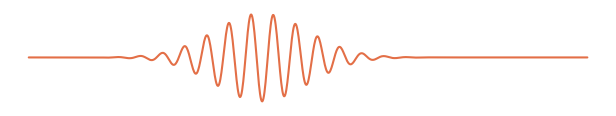

┌ Warning: `getindex(f::Figure, x)` is deprecated, use `getproperty(f, x)` instead.
│   caller = _show(::IOStream, ::MIME{Symbol("application/pdf")}, ::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1332
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1332
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _show(::IOStream, ::MIME{Symbol("application/pdf")}, ::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1332
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1332
┌ Warning: `getindex(f::Figure, x)` is deprecated, use `getproperty(f, x)` instead.
│   caller = _show(::IOStream, ::MIME{Symbol("application/pdf")}, ::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1332
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1332


In [20]:
ppp2 = Plots.plot(time_coord, wave_phase_r, c = 2, line = 1.5, size = (600, 100), legend = :none, axis = false, grid = false)
#savefig(ppp2, "D:/Documents/Diplomka/Obhajoba/grav_wave_profile.pdf")

┌ Warning: Deprecated syntax `implicit assignment to global variable `t``.
│ Use `global t` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `xi_r``.
│ Use `global xi_r` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `yi_r``.
│ Use `global yi_r` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `zi_r``.
│ Use `global zi_r` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `xi_n``.
│ Use `global xi_n` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `yi_n``.
│ Use `global yi_n` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `zi_n``.
│ Use `global zi_n` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `pp1``.
│ Use `global pp1` instead.
└ @ nothing none:0


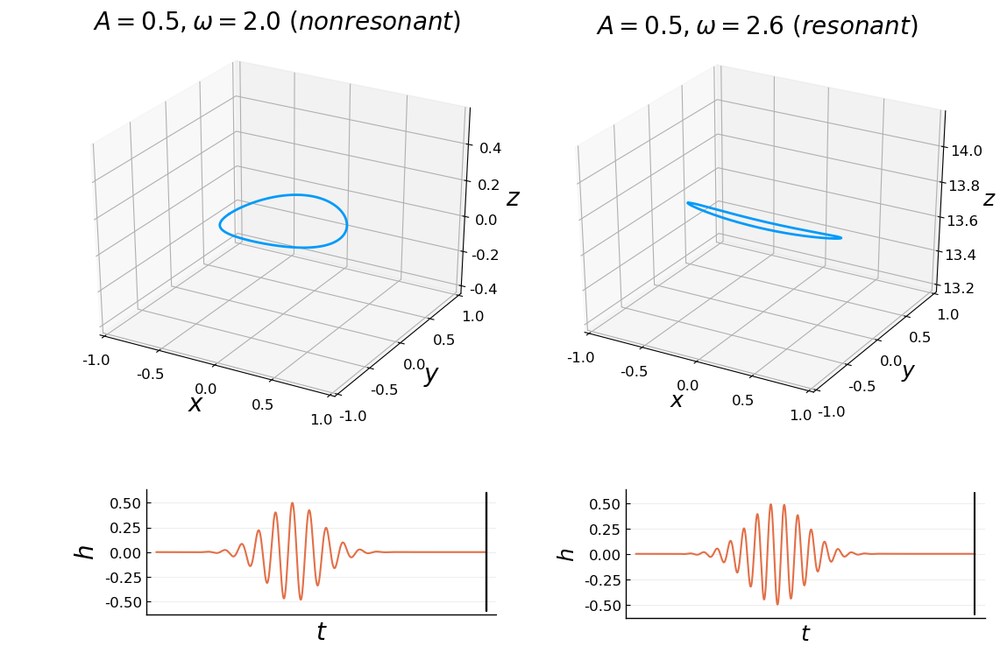

┌ Warning: `getindex(f::Figure, x)` is deprecated, use `getproperty(f, x)` instead.
│   caller = _show(::IOStream, ::MIME{Symbol("image/png")}, ::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1332
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1332
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _show(::IOStream, ::MIME{Symbol("image/png")}, ::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1332
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1332
┌ Warning: `getindex(f::Figure, x)` is deprecated, use `getproperty(f, x)` instead.
│   caller = _show(::IOStream, ::MIME{Symbol("image/png")}, ::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1332
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1332


Animation("C:\\Users\\Vojta\\AppData\\Local\\Temp\\jl_4CD2.tmp", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000992.png", "000993.png", "000994.png", "000995.png", "000996.png", "000997.png", "000998.png", "000999.png", "001000.png", "001001.png"])

In [21]:
N_time = 1000
time_c = tspan[1]:tspan[2]/N_time:tspan[2]
N = 500
sigma_c = 0:2*pi/N:2*pi

time_opt_r(tau, t, s) = time_u_v_r(tau,s) - t
time_opt_n(tau, t, s) = time_u_v_n(tau,s) - t

param_tau_r = Array{Float64, 1}(undef, length(time_c))
param_tau_n = Array{Float64, 1}(undef, length(time_c))
time_coord = range(0.0, length = length(time_c), stop = time_u_v_n(time_c[end],pi/4))
for j = 1:size(time_coord, 1)
    t = time_coord[j]
    tau_r = find_zero(ttau -> time_opt_r(ttau, t, pi/4), time_c[j], xatol=1e-6)
    tau_n = find_zero(ttau -> time_opt_n(ttau, t, pi/4), time_c[j], xatol=1e-6)
    param_tau_r[j] = tau_r
    param_tau_n[j] = tau_n
end

pyplot()
x_s_r(t,s) = splx_r(t)*cos(s)
y_s_r(t,s) = sply_r(t)*sin(s)
x_s_n(t,s) = splx_n(t)*cos(s)
y_s_n(t,s) = sply_n(t)*sin(s)

wave_phase_r = grav_wave(time_coord, [p_r[1], p_r[2], p_r[3], p_r[4], p_r[5]])

wave_phase_n = grav_wave(time_coord, [p_n[1], p_n[2], p_n[3], p_n[4], p_n[5]])

lay = @layout[ [a{1.0w}; b{0.9w}] [c{0.9h}; d{0.1h}]]

anim = @animate for t = 1:size(time_c,1)
    xi_r = [x_s_r(param_tau_r[t],s) for s in sigma_c]
    yi_r = [y_s_r(param_tau_r[t],s) for s in sigma_c]
    zi_r = [z_u_v_r(param_tau_r[t],s) for s in sigma_c] 

    xi_n = [x_s_n(param_tau_n[t],s) for s in sigma_c]
    yi_n = [y_s_n(param_tau_n[t],s) for s in sigma_c]
    zi_n = [z_u_v_n(param_tau_n[t],s) for s in sigma_c] 

    pp1 = Plots.plot(xi_r, yi_r, zi_r, xlims = (-1.0, 1.0), ylims = (-1.0, 1.0), zlims = (mean(zi_r)-0.5, mean(zi_r)+0.5), 
        xlabel = L"x", ylabel = L"y", zlabel = L"z", linewidth = 2, legend = :none, aspect_ratio = 0.8, #size = (300, 400),
    line = 2, foreground_color_guide = :black, 
    title = latexstring("A = 0.5, \\omega = $(round(w_r, digits = 1)) \\, \\, (resonant)"))

    pp2 = Plots.plot(time_coord, wave_phase_r, c = 2, line = 1.5)
    Plots.plot!([time_coord[t], time_coord[t]], [-p_r[1]-0.1, p_r[1]+0.1], aspect_ratio = 18,
    label = "", c = :black, xlabel = L"t", ylabel = L"h}", legend = :none, xticks=false, line = 1.5)

    pp3 = plot(legend=false,grid=false,foreground_color_subplot=:white)

    pp4 = Plots.plot(xi_n, yi_n, zi_n, xlims = (-1.0, 1.0), ylims = (-1.0, 1.0), zlims = (mean(zi_n)-0.5, mean(zi_n)+0.5), 
        xlabel = L"x", ylabel = L"y", zlabel = L"z", linewidth = 2, legend = :none, aspect_ratio = 0.8, #size = (300, 400),
    line = 2, foreground_color_guide = :black, 
    title = latexstring("A = 0.5,\\omega = $(round(w_n, digits = 1)) \\, \\, (nonresonant)"))

    pp5 = Plots.plot(time_coord, wave_phase_n, c = 2, line = 1.5)
    Plots.plot!([time_coord[t], time_coord[t]], [-p_n[1]-0.1, p_n[1]+0.1], aspect_ratio = 18,
    label = "", c = :black, xlabel = L"t", ylabel = L"h}", legend = :none, xticks=false, line = 1.7)

    pp6 = plot(legend=false,grid=false,foreground_color_subplot=:white)

    pp_r = Plots.plot(pp1, pp3, pp2, layout = @layout[ a{0.8h}; b{0.1w} c{0.90w}], size = (600, 800), 
    legendfontsize = 15, guidefontsize = 18, tickfontsize = 12, left_margin = -0.7cm)

    pp_n = Plots.plot(pp4, pp6, pp5, layout = @layout[ a{0.8h}; b{0.1w} c{0.90w}], size = (600, 800), 
    legendfontsize = 15, guidefontsize = 20, tickfontsize = 12, left_margin = -1.1cm)
    
    ppp = Plots.plot(pp_n, pp_r, layout = @layout([a b]), size = (1080, 800), titlefontsize = 20)
    
    #savefig(ppp, "D:/Documents/Diplomka/Animations/string_grav_combined/string_grav_$(t).pdf")
end

In [22]:
gif(anim, "D:/Documents/Diplomka/Animations/string_grav.gif")

┌ Info: Saved animation to 
│   fn = D:\Documents\Diplomka\Animations\string_grav.gif
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\animation.jl:90


Plots.AnimatedGif("D:\\Documents\\Diplomka\\Animations\\string_grav.gif")

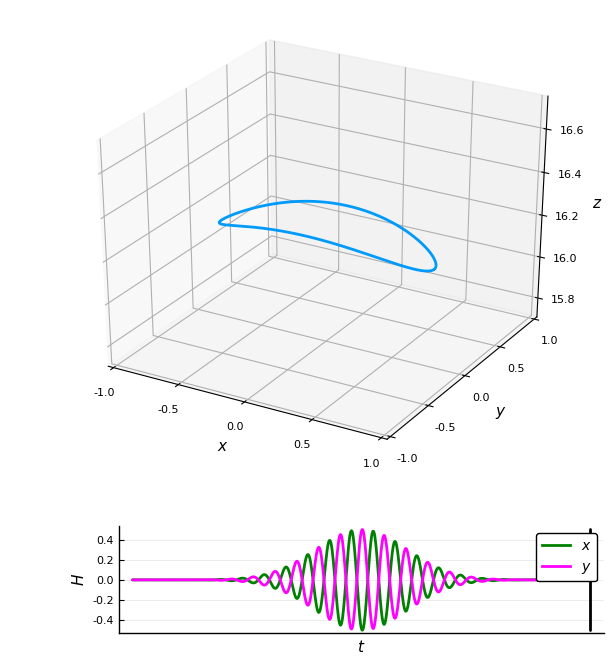

┌ Warning: Deprecated syntax `implicit assignment to global variable `t``.
│ Use `global t` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `xi``.
│ Use `global xi` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `yi``.
│ Use `global yi` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `zi``.
│ Use `global zi` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `pp1``.
│ Use `global pp1` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `pp2``.
│ Use `global pp2` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `pp3``.
│ Use `global pp3` instead.
└ @ nothing none:0
┌ Warning: Deprecated syntax `implicit assignment to global variable `ppp``.
│ Use `global ppp` instead.
└ @ nothing none:0
┌ Warning: Loop va

Animation("C:\\Users\\Vojta\\AppData\\Local\\Temp\\jl_6D31.tmp", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000992.png", "000993.png", "000994.png", "000995.png", "000996.png", "000997.png", "000998.png", "000999.png", "001000.png", "001001.png"])

In [25]:
N_time = 1000
time_c = tspan[1]:tspan[2]/N_time:tspan[2]
N = 500
sigma_c = 0:2*pi/N:2*pi

time_opt(tau, t, s) = time_u_v(tau,s) - t

param_tau = Array{Float64, 1}(undef, length(time_c))
time_coord = range(time_u_v(time_c[1],pi/4), length = length(time_c), stop = time_u_v(time_c[end],pi/4))
for j = 1:size(time_coord, 1)
    t = time_coord[j]
    ff(tau) = time_opt(tau, t, pi/4)
    tau = find_zero(ttau -> time_opt(ttau, t, pi/4), time_c[j], xatol=1e-6)
    param_tau[j] = tau
end

pyplot()
x_s(t,s) = splx(t)*cos(s)
y_s(t,s) = sply(t)*sin(s)

wave_phase_x = grav_wave(time_coord, [p[1], p[2], p[3], p[4], p[5]])
wave_phase_y = grav_wave(time_coord, [-p[1], p[2], p[3], p[4], p[6]])

lay = @layout[ a{0.8w} b{0.2w} ]
anim = @animate for t = 1:size(time_c,1)
xi = [x_s(param_tau[t],s) for s in sigma_c]
    yi = [y_s(param_tau[t],s) for s in sigma_c]
    zi = [z_u_v(param_tau[t],s) for s in sigma_c] 
    pp1 = Plots.plot(xi, yi, zi, xlims = (-1.0, 1.0), ylims = (-1.0, 1.0), zlims = (mean(zi)-0.5, mean(zi)+0.5), 
        xlabel = L"x", ylabel = L"y", zlabel = L"z", linewidth = 2, legend = :none, aspect_ratio = 0.8, line = 2)
    pp2 = Plots.plot(time_coord, wave_phase_x, label = L"x", c = :green, line = 1.5)
    Plots.plot!(time_coord, wave_phase_y, label = L"y", c = :magenta, line = 1.5)
    Plots.plot!([time_coord[t], time_coord[t]], [-p[1]-0.1, p[1]+0.1], aspect_ratio = 11, 
    label = "", c = :black, xlabel = L"t", ylabel = L"H", legend = :topright, xticks=false, line = 1.5)
    pp3 = plot(legend=false,grid=false,foreground_color_subplot=:white)

    ppp = Plots.plot(pp1, pp3, pp2, layout = @layout[ a{0.8h}; b{0.05w} c{0.95w}], size = (600, 700), 
    legendfontsize = 12, guidefontsize = 15, tickfontsize = 10)
    savefig(ppp, "D:/Documents/Diplomka/Animations/string_grav_nonresonant/string_grav_$(t).pdf")
end
#savefig(pp, "D:/Documents/Diplomka/Animations/string_grav_1/string_grav_$(ii).pdf")

In [30]:
gif(anim)#"D:/Documents/Diplomka/Animations/string_grav_1/string_grav.gif")

┌ Info: Saved animation to 
│   fn = D:\Documents\Diplomka\tmp.gif
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\animation.jl:90


Plots.AnimatedGif("D:\\Documents\\Diplomka\\tmp.gif")

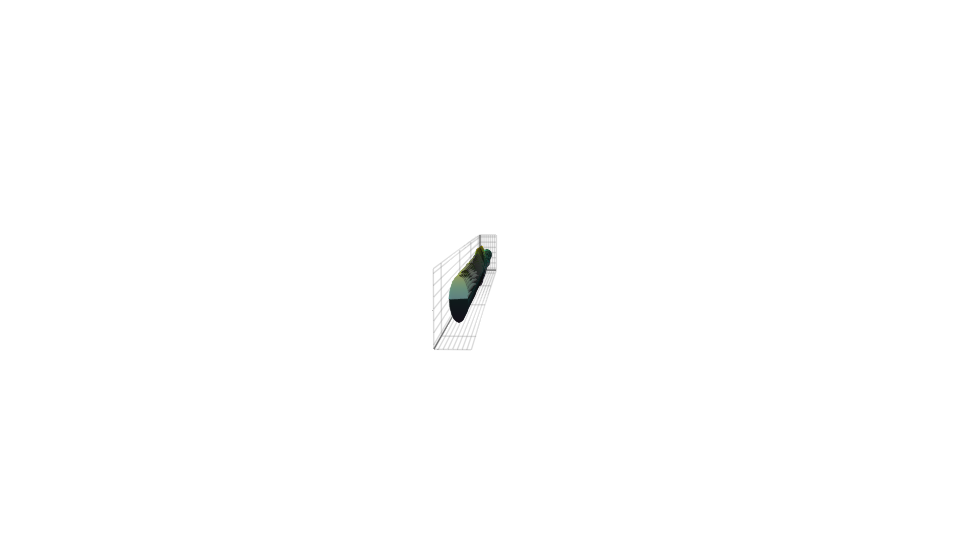

In [22]:
using Makie
scene = Scene(resolution = (500, 500))

N = 500
time_c = tspan[1]:tspan[2]/N:tspan[2]
sigma_c = 0:2*pi/N:2*pi

time = [collect(time_c) for i = 1:N]
sigma = [collect(sigma_c) for i = 1:N_time]
x_comb = [splx(t)*cos(s) for t in time_c, s in sigma_c]
y_comb = [sply(t)*sin(s) for t in time_c, s in sigma_c]
v_comb = [time_u_v(t, s) for t in time_c, s in sigma_c]
n = N
scene = Makie.surface(v_comb[div(N,n):end,:]/10,x_comb[div(N,n):end,:], y_comb[div(N,n):end,:], size = (800, 600))

eyepos = Vec3f0(10, 10, 10)
lookat = Vec3f0(25,0,0)
#update_cam!(scene, eyepos, lookat)
scene

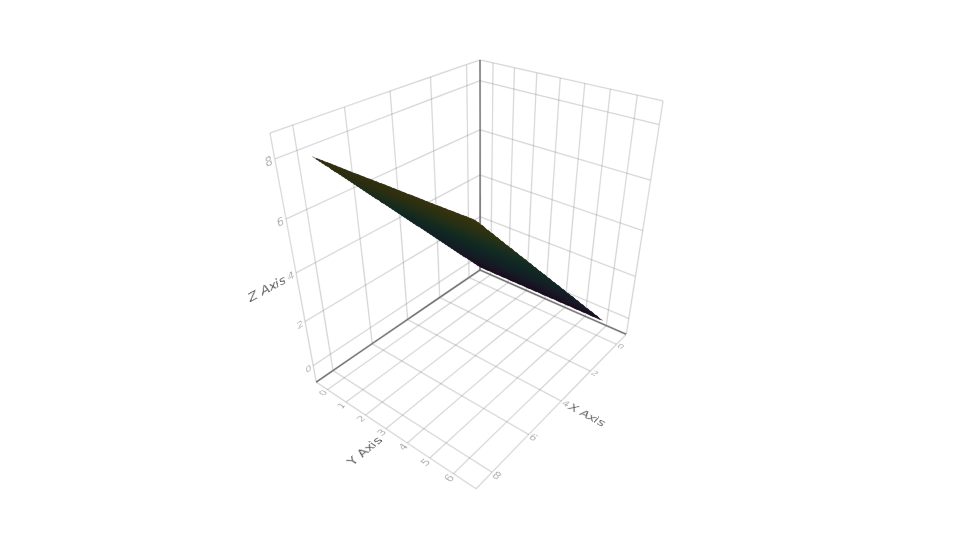

In [24]:
using Makie
scene = Scene(resolution = (500, 500))

N_time = 500
time_c = tspan[1]:tspan[2]/N_time:tspan[2]
N = 500
sigma_c = 0:2*pi/N:2*pi

time = [collect(time_c) for i = 1:N]
sigma = [collect(sigma_c) for i = 1:N_time]
t_comb = [time_u_v(t, s) for t in time_c, s in sigma_c]
Makie.surface(time_c/10, sigma_c, t_comb/10, size = (800, 600))

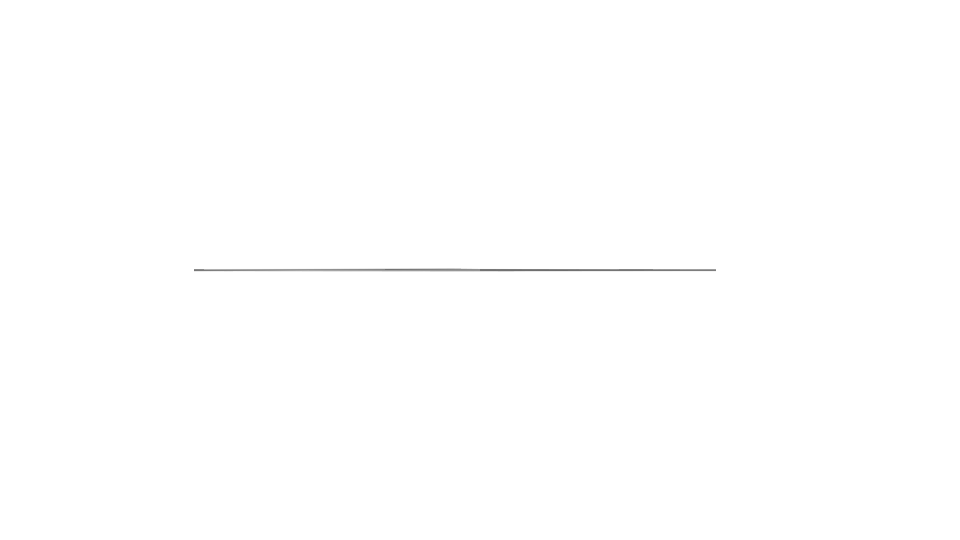

In [25]:
z_comb = [z_u_v(t, s) for t in time_c, s in sigma_c]
Makie.surface(time_c/10, sigma_c, z_comb/10, size = (800, 600))

In [23]:
soldx = sol[1, :]
soldy = sol[3, :]
soldv0 = sol[5, :]
soldv2 = sol[7, :]


spldx = Spline1D(sol.t, soldx)
spldy = Spline1D(sol.t, soldy)
spldv0 = Spline1D(sol.t, soldv0)
spldv2 = Spline1D(sol.t, soldv2)

Spline1D(knots=[0.0,0.0190182 … 199.041,200.0] (345 elements), k=3, extrapolation="nearest", residual=0.0)

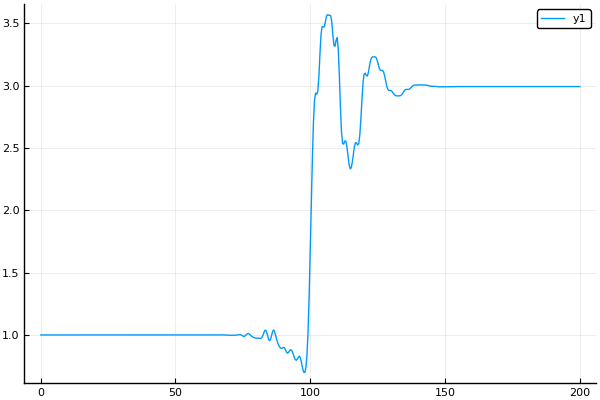

In [24]:
energy = [-2*lam*spldv0(t) for t in time_c]
Plots.plot(time_c, energy)

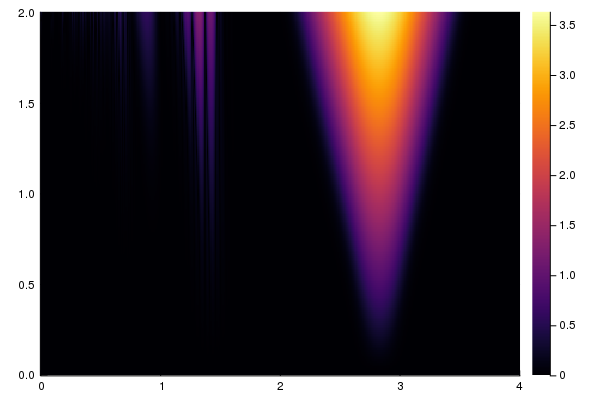

In [174]:
E_T_0 = 1.0
aa = 0.0:0.01:2.0
ww = 0.0:0.01:4.0
energy_diff = Array{Float64,2}(undef, length(aa),length(ww))
for a in aa
    for w in ww
        lam = 1/sqrt(2)
        u0 = [0.0;0.5;0.0;0.5;-lam;0.0;0.0;0.0]
        tspan = (0.0,100.0)
        p = [a,w, 50, 15, 1, 1, 0, 2,lam]

        prob = ODEProblem(diff_eq2,u0,tspan,p)
        sol = solve(prob);

        energy1 = -2*lam*sol[5, 1]*E_T_0
        energy2 = -2*lam*sol[5, end]*E_T_0
        energy_diff[Int(round(a/step(aa)))+1, Int(round(w/step(ww)))+1] = energy2-energy1
    end
end
Plots.heatmap(ww, aa, log.(10, 1 .+ abs.(energy_diff)))

┌ Warning: `binary_minheap(xs::AbstractVector{T}) where T` is deprecated, use `BinaryMinHeap(xs)` instead.
│   caller = tstop_saveat_disc_handling at solve.jl:371 [inlined]
└ @ Core C:\Users\Vojta\.julia\packages\OrdinaryDiffEq\NS3ps\src\solve.jl:371
┌ Warning: `binary_minheap(xs::AbstractVector{T}) where T` is deprecated, use `BinaryMinHeap(xs)` instead.
│   caller = #__init#203(::Int64, ::Array{Float64,1}, ::Array{Float64,1}, ::Array{Float64,1}, ::Nothing, ::Bool, ::Nothing, ::Bool, ::Bool, ::Nothing, ::Bool, ::Bool, ::Float64, ::Bool, ::Rational{Int64}, ::Nothing, ::Nothing, ::Int64, ::Rational{Int64}, ::Int64, ::Int64, ::Rational{Int64}, ::Bool, ::Int64, ::Nothing, ::Nothing, ::Int64, ::Float64, ::Float64, ::typeof(DiffEqBase.ODE_DEFAULT_NORM), ::typeof(LinearAlgebra.opnorm), ::typeof(DiffEqBase.ODE_DEFAULT_ISOUTOFDOMAIN), ::typeof(DiffEqBase.ODE_DEFAULT_UNSTABLE_CHECK), ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Bool, ::Int64, ::String, ::typeof(DiffEqBase.ODE_DEFAU

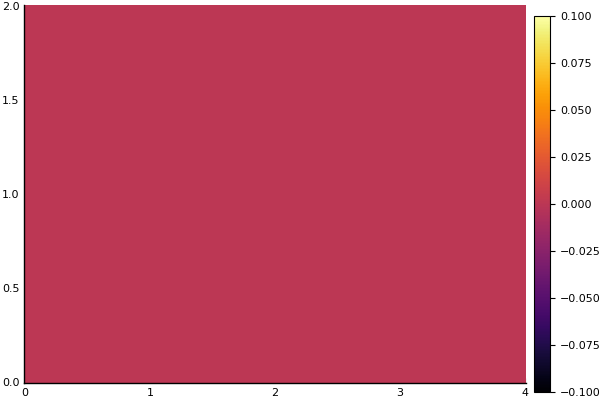

┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _before_layout_calcs(::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1015
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1015
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _update_min_padding!(::Plots.Subplot{Plots.PyPlotBackend}) at pyplot.jl:1175
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1175
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _update_min_padding!(::Plots.Subplot{Plots.PyPlotBackend}) at pyplot.jl:1175
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On

In [10]:
E_T_0 = 1.0
aa = 0.0:0.01:2.0
ww = 0.0:0.01:4.0
energy_end = Array{Float64,2}(undef, length(aa),length(ww))
for a in aa
    for w in ww
        lam = 1/sqrt(2)
        u0 = [0.0;0.5;0.0;0.5;-lam;0.0;0.0;0.0]
        tspan = (0.0,100.0)
        p = [a,w, 50, 10, 1, 1, 0, 2,lam]

        prob = ODEProblem(diff_eq2,u0,tspan,p)
        sol = solve(prob);

        energy1 = -2*lam*sol[5, 1]*E_T_0
        energy2 = -2*lam*sol[5, end]*E_T_0
        if energy2 < 0
            energy_end[Int(round(a/step(aa)))+1, Int(round(w/step(ww)))+1] = energy2
        else
            energy_end[Int(round(a/step(aa)))+1, Int(round(w/step(ww)))+1] = 0.0
        end
    end
end
Plots.heatmap(ww, aa, energy_end)

In [11]:
sum(energy_end)

0.0

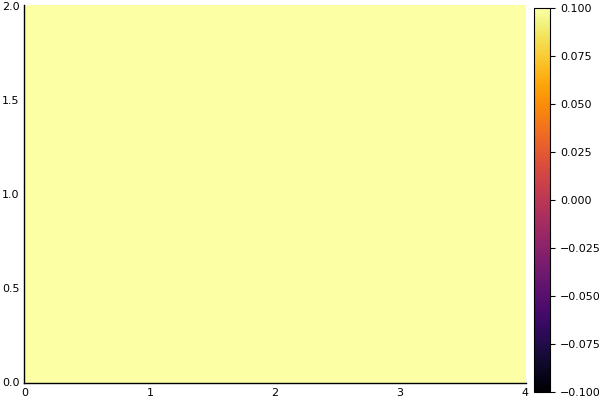

In [12]:
E_T_0 = 1.0
aa = 0.0:0.01:2.0
ww = 0.0:0.01:4.0
energy_pos = Array{Float64,2}(undef, length(aa),length(ww))
for a in aa
    for w in ww
        lam = 1/sqrt(2)
        u0 = [0.0;0.5;0.0;0.5;-lam;0.0;0.0;0.0]
        tspan = (0.0,100.0)
        p = [a,w, 50, 10, 1, 1, 0, 2,lam]

        prob = ODEProblem(diff_eq2,u0,tspan,p)
        sol = solve(prob);

        energy1 = -2*lam*sol[5, 1]*E_T_0
        energy2 = -2*lam*sol[5, end]*E_T_0
        if energy2 < 0
            energy_pos[Int(round(a/step(aa)))+1, Int(round(w/step(ww)))+1] = 0.0
        elseif energy2 == 0
            energy_pos[Int(round(a/step(aa)))+1, Int(round(w/step(ww)))+1] = 0.5
        elseif energy2 > 0
            energy_pos[Int(round(a/step(aa)))+1, Int(round(w/step(ww)))+1] = 1.0
        else
            energy_pos[Int(round(a/step(aa)))+1, Int(round(w/step(ww)))+1] = -1.0
        end
    end
end
Plots.heatmap(ww, aa, energy_pos)

┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_add_series(::Plots.Plot{Plots.PyPlotBackend}, ::Plots.Series) at pyplot.jl:717
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:717
┌ Warning: `getindex(o::PyObject, s::AbstractString)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o."s"` instead of `o["s"]`.
│   caller = py_mask_nans(::Array{Float64,2}) at pyplot.jl:255
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:255
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_mask_nans(::Array{Float64,2}) at pyplot.jl:255
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:255
┌ Warning

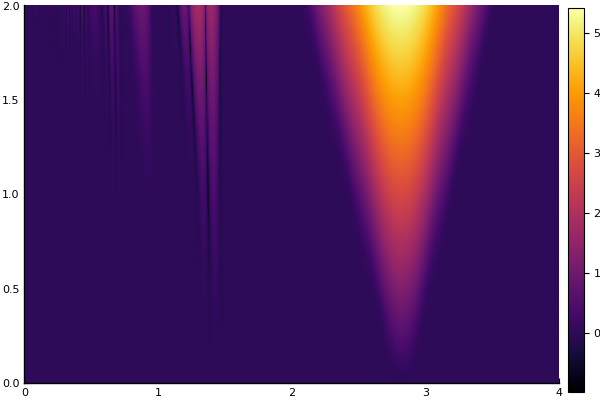

┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _before_layout_calcs(::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1015
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1015
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _update_min_padding!(::Plots.Subplot{Plots.PyPlotBackend}) at pyplot.jl:1175
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1175
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _update_min_padding!(::Plots.Subplot{Plots.PyPlotBackend}) at pyplot.jl:1175
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On

In [61]:
E_T_0 = 1.0
aa = 0.0:0.005:2.0
ww = 0.0:0.005:4.0
energy_div = Array{Float64,2}(undef, length(aa),length(ww))
velocity_z = Array{Float64,2}(undef, length(aa),length(ww))
for a in aa
    for w in ww
        lam = 1/sqrt(2)
        u0 = [0.0;0.5;0.0;0.5;-lam;0.0;0.0;0.0]
        tspan = (0.0,100.0)
        p = [a,w, 50, 15, 1, 1, 0, 2,lam]

        prob = ODEProblem(diff_eq2,u0,tspan,p)
        sol = solve(prob);

        energy1 = -2*lam*sol[5, 1]*E_T_0
        energy2 = -2*lam*sol[5, end]*E_T_0
        velocity = -(lam + sol[5,end])/(lam - sol[5,end])
        energy_div[Int(round(a/step(aa)))+1, Int(round(w/step(ww)))+1] = sqrt(energy2/energy1)
        velocity_z[Int(round(a/step(aa)))+1, Int(round(w/step(ww)))+1] = velocity
    end
end
Plots.heatmap(ww, aa, log.(10, energy_div))

┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_add_series(::Plots.Plot{Plots.PyPlotBackend}, ::Plots.Series) at pyplot.jl:717
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:717
┌ Warning: `getindex(o::PyObject, s::AbstractString)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o."s"` instead of `o["s"]`.
│   caller = py_mask_nans(::Array{Float64,2}) at pyplot.jl:255
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:255
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = py_mask_nans(::Array{Float64,2}) at pyplot.jl:255
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:255
┌ Warning

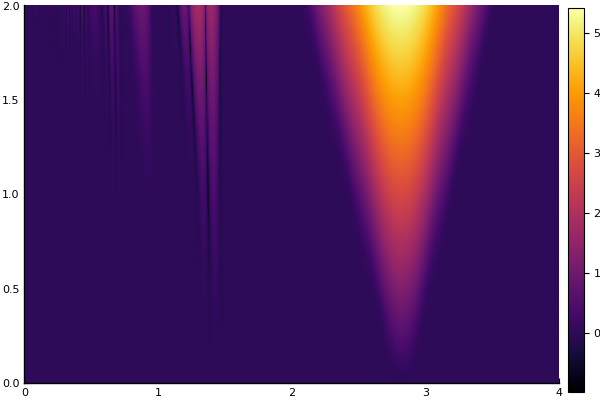

┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _update_min_padding!(::Plots.Subplot{Plots.PyPlotBackend}) at pyplot.jl:1175
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1175
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _update_min_padding!(::Plots.Subplot{Plots.PyPlotBackend}) at pyplot.jl:1175
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1175
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _update_plot_object(::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1304
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\

In [185]:
E_T_0 = 1.0
aa = 0.0:0.005:2.0
ww = 0.0:0.005:4.0
energy_div = Array{Float64,2}(undef, length(aa),length(ww))
velocity_z = Array{Float64,2}(undef, length(aa),length(ww))
for a in aa
    for w in ww
        lam = 1/sqrt(2)
        u0 = [0.0;0.5;0.0;0.5;-lam;0.0;0.0;0.0]
        tspan = (0.0,100.0)
        p = [a,w, 50, 15, 1, 1, 0, 2,lam]

        prob = ODEProblem(diff_eq2,u0,tspan,p)
        sol = solve(prob);

        energy1 = -2*lam*sol[5, 1]*E_T_0
        energy2 = -2*lam*sol[5, end]*E_T_0
        velocity = -(lam + sol[5,end])/(lam - sol[5,end])
        energy_div[Int(round(a/step(aa)))+1, Int(round(w/step(ww)))+1] = sqrt(energy2/energy1)
        velocity_z[Int(round(a/step(aa)))+1, Int(round(w/step(ww)))+1] = velocity
    end
end
Plots.heatmap(ww, aa, log.(10, energy_div))

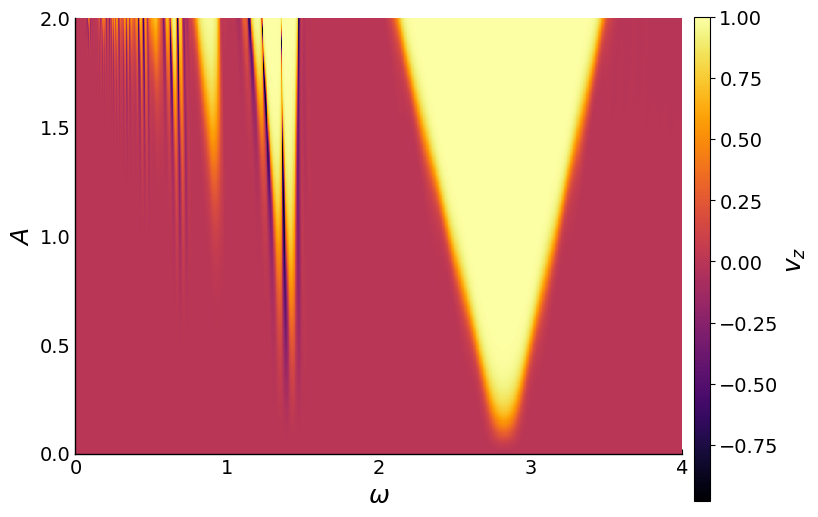

In [209]:
p1 = Plots.plot(ww, aa, velocity_z, seriestype = :heatmap, 
    colorbar_title = latexstring("v_z"), xlabel = L"\omega", ylabel = L"A", 
    size = (800, 500),tickfontsize = 14, guidefontsize = 18)
#Plots.savefig(p1, "grav_velocity.png")

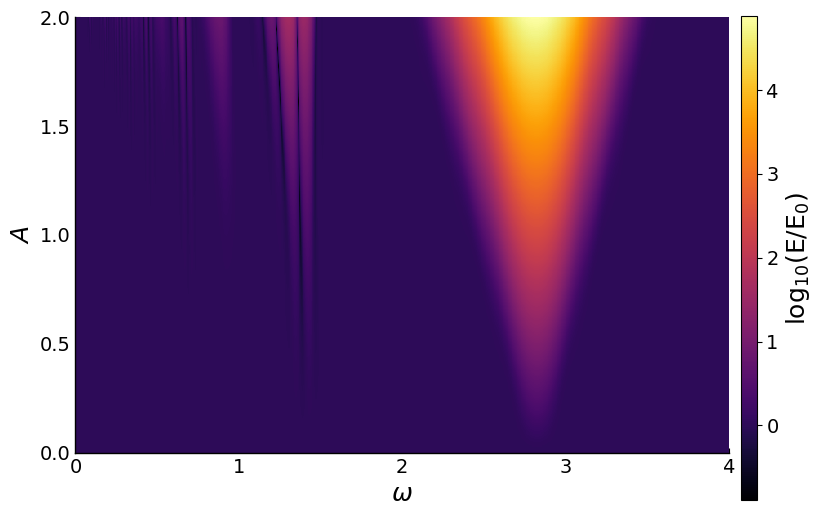

In [210]:
p1 = Plots.plot(ww, aa, 0.9*log.(10, energy_div), seriestype = :heatmap, 
    colorbar_title = latexstring("\\rm{log}_{10} (E/E_0)"), xlabel = L"\omega", ylabel = L"A", 
    size = (800, 500),tickfontsize = 14, guidefontsize = 18)
#Plots.savefig(p1, "grav_energy.png")

In [28]:
dtime_u_v(t,s) = sqrt(2)/2*(lam - spldv0(t))
dz_u_v(t,s) = sqrt(2)/2*(lam + spldv0(t))

dz_u_v (generic function with 1 method)

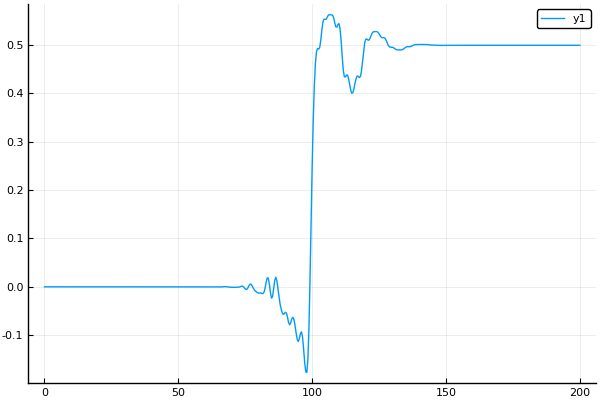

In [29]:
velocity = [-dz_u_v(t, 0)/dtime_u_v(t,0) for t in time_c]
Plots.plot(time_c, velocity)

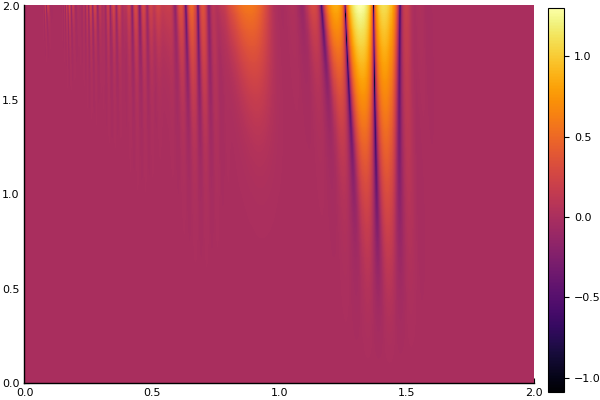

In [192]:
E_T_0 = 1.0
s_aa = 0.0:0.005:2.0
s_ww = 0.0:0.002:2.0
s_energy_div = Array{Float64,2}(undef, length(s_aa),length(s_ww))
s_velocity_z = Array{Float64,2}(undef, length(s_aa),length(s_ww))
for a in s_aa
    for w in s_ww
        lam = 1/sqrt(2)
        u0 = [0.0;0.5;0.0;0.5;-lam;0.0;0.0;0.0]
        tspan = (0.0,100.0)
        p = [a,w, 50, 10, 1, 1, 0, 2,lam]

        prob = ODEProblem(diff_eq2,u0,tspan,p)
        sol = solve(prob);

        energy1 = -2*lam*sol[5, 1]*E_T_0
        energy2 = -2*lam*sol[5, end]*E_T_0
        velocity = -(lam + sol[5,end])/(lam - sol[5,end])
        s_energy_div[Int(round(a/step(s_aa)))+1, Int(round(w/step(s_ww)))+1] = sqrt(energy2/energy1)
        s_velocity_z[Int(round(a/step(s_aa)))+1, Int(round(w/step(s_ww)))+1] = velocity
    end
end
Plots.heatmap(s_ww, s_aa, log.(10, s_energy_div))

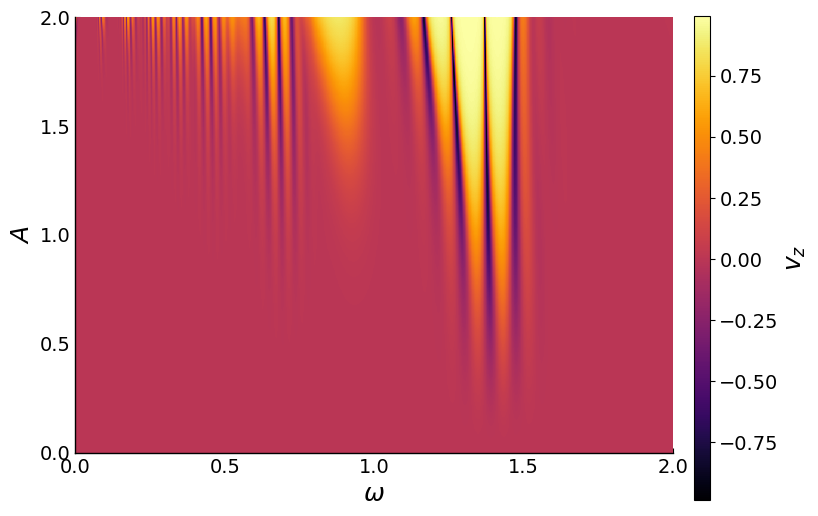

In [211]:
p1 = Plots.plot(s_ww, s_aa, s_velocity_z, seriestype = :heatmap, 
    colorbar_title = latexstring("v_z"), xlabel = L"\omega", ylabel = L"A", 
    size = (800, 500),tickfontsize = 14, guidefontsize = 18)
#Plots.savefig(p1, "grav_velocity_small.png")

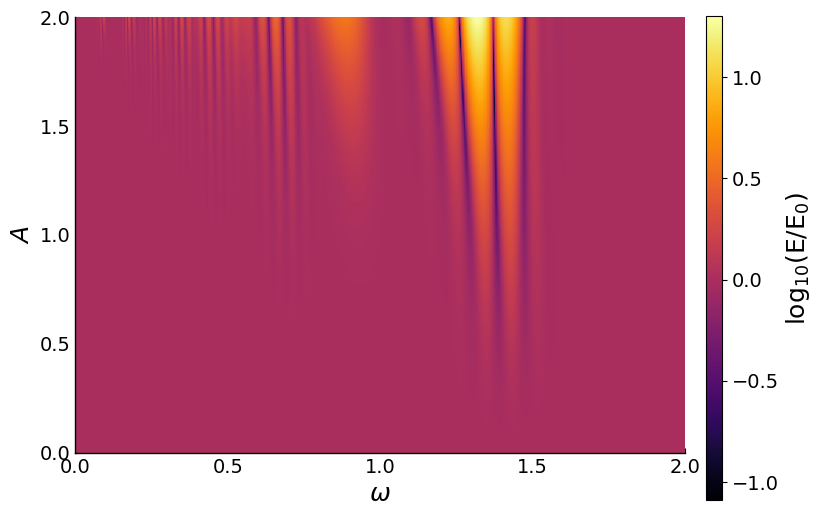

In [212]:
p1 = Plots.plot(s_ww, s_aa, log.(10, s_energy_div), seriestype = :heatmap, 
    colorbar_title = latexstring("\\rm{log}_{10} (E/E_0)"), xlabel = L"\omega", ylabel = L"A", 
    size = (800, 500),tickfontsize = 14, guidefontsize = 18)
#Plots.savefig(p1, "grav_energy_small.png")